In [1]:
rm(list=ls())
library(MAST)
library(scran)
library(scds)
library(scDblFinder)
library(Seurat)
library(Matrix)
library(cowplot) 
library(gridExtra)
library(dplyr)
library(clustree)
library(DT)
library(pheatmap)
library(RColorBrewer)
library(gplots)
library(pracma)
library(monocle)
library(corrplot)
options(mc.cores = 64)

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: 'BiocGenerics'


The following objects are masked from 'package:parallel':

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from 'package:stats':

    IQR, mad, sd, var, xtabs


The following objects are masked from 'package:base':

    Filter, Find, Map, Position, Reduce, anyDuplicated, append,
    as.data.frame, basename, cbind, colnames, dirname, do.call,
    duplicated, eval, evalq, get, grep, grepl, intersect, is.unsorted,
    lapply, mapply, match, mget, order, paste, pmax, pmax.int, pmin,
    pmin.int, rank, rbind, rownames, sapply, setdiff, sort, table,
   

<h2>1.Read multiple Seurat data (4 CL10) and merger into one object </h2>

In [2]:
data_list <- c("CLS1P", "CLS1D4", "CLS1D7","CLS1D14")
sc.list <- lapply(data_list, function(v){readRDS(paste0('/mnt/isilonX200/scRNA/Project_1/Result/', v,'.qc.Rds'))})

In [3]:
color_style = c("CLS1-P" = "#14c770", "CLS1-D4" = "#f5c242", "CLS1-D7" = "#e86b5d", "CLS1-D14" = "#54d1cd")
order_list = c("CLS1-P","CLS1-D4","CLS1-D7","CLS1-D14")

In [4]:
names(sc.list) <- data_list
sapply(sc.list, dim)

CLS1P,CLS1D4,CLS1D7,CLS1D14
33538,33538,33538,33538
3089,3199,3320,2389


In [5]:
sc.list

$CLS1P
An object of class Seurat 
67076 features across 3089 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

$CLS1D4
An object of class Seurat 
67076 features across 3199 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

$CLS1D7
An object of class Seurat 
67076 features across 3320 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

$CLS1D14
An object of class Seurat 
67076 features across 2389 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM


In [6]:
scdata <- merge(sc.list[[1]], y = c(sc.list[[2]], sc.list[[3]], sc.list[[4]]))

In [7]:
scdata$condition <- factor(scdata$condition, levels = order_list, ordered = TRUE)
scdata

An object of class Seurat 
67076 features across 11997 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

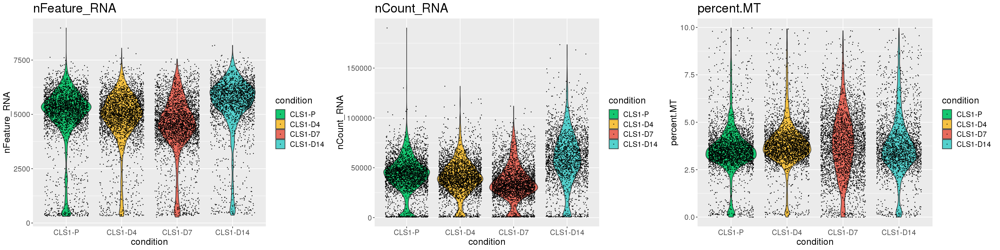

In [8]:
options(repr.plot.width=24, repr.plot.height=6)
vgp1 <- ggplot(scdata[[]], aes(x=condition, y=nFeature_RNA, fill=condition))+
        geom_violin()+
        geom_point(position="jitter", size=0.1)+
        theme(text = element_text(size = 16), plot.title = element_text(size=22))+
        scale_fill_manual(values = color_style)+
        labs(title = "nFeature_RNA")
vgp2 <- ggplot(scdata[[]], aes(x=condition, y=nCount_RNA, fill=condition))+
        geom_violin()+
        geom_point(position="jitter", size=0.1)+
        theme(text = element_text(size = 16), plot.title = element_text(size=22))+
        scale_fill_manual(values = color_style)+
        labs(title = "nCount_RNA")
vgp3 <- ggplot(scdata[[]], aes(x=condition, y=percent.MT, fill=condition))+
        geom_violin()+
        geom_point(position="jitter", size=0.1)+
        theme(text = element_text(size = 16), plot.title = element_text(size=22))+
        scale_fill_manual(values = color_style)+
        labs(title = "percent.MT")
plot_grid(vgp1, vgp2, vgp3, ncol=3)

In [9]:
ncells <- rowSums(GetAssayData(scdata, assay = 'RNA', slot = 'data') > 0)
scdata <- scdata[ncells > 15, ]
scdata
saveRDS(scdata, file = '/mnt/isilonX200/scRNA/Project_1/Result/CLS1.merge.noc.Rds')

An object of class Seurat 
37380 features across 11997 samples within 2 assays 
Active assay: RNA (18690 features, 0 variable features)
 1 other assay present: logCPM

<h2>2.Normalization (logCPM)</h2>

In [10]:
scdata <- readRDS(file = '/mnt/isilonX200/scRNA/Project_1/Result/CLS1.merge.noc.Rds')

In [11]:
scdata.count <- scdata
scdata <- NormalizeData(scdata)
scdata <- RenameAssays(scdata, RNA = 'logCPM')# GetAssayData(scdata, assay = 'logCPM', slot = 'data')[1:15,1:3]
scdata@assays$Count <- scdata.count@assays$RNA # scdata@active.assay <- 'logCPM'
scdata

Renaming default assay from RNA to logCPM



An object of class Seurat 
37380 features across 11997 samples within 2 assays 
Active assay: logCPM (18690 features, 0 variable features)
 1 other assay present: Count

In [12]:
str(scdata)

Formal class 'Seurat' [package "Seurat"] with 12 slots
  ..@ assays      :List of 2
  .. ..$ logCPM:Formal class 'Assay' [package "Seurat"] with 8 slots
  .. .. .. ..@ counts       :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:58554242] 8 13 15 20 24 27 29 30 32 33 ...
  .. .. .. .. .. ..@ p       : int [1:11998] 0 6457 12562 18693 24524 30553 35963 40115 44798 48511 ...
  .. .. .. .. .. ..@ Dim     : int [1:2] 18690 11997
  .. .. .. .. .. ..@ Dimnames:List of 2
  .. .. .. .. .. .. ..$ : chr [1:18690] "AL627309.1" "AL669831.5" "LINC00115" "FAM41C" ...
  .. .. .. .. .. .. ..$ : chr [1:11997] "AAACCTGCAGCTGTTA-1-CLS1-P" "AAACCTGGTACCAGTT-1-CLS1-P" "AAACCTGGTGCTCTTC-1-CLS1-P" "AAACCTGTCCACTCCA-1-CLS1-P" ...
  .. .. .. .. .. ..@ x       : num [1:58554242] 3 2 1 4 3 2 2 1 1 36 ...
  .. .. .. .. .. ..@ factors : list()
  .. .. .. ..@ data         :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:5

<h2>3.Highly variable genes (vst, top4000)</h2>

In [13]:
scdata <- FindVariableFeatures(scdata, selection.method = "vst", nfeatures = 4000)

Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."


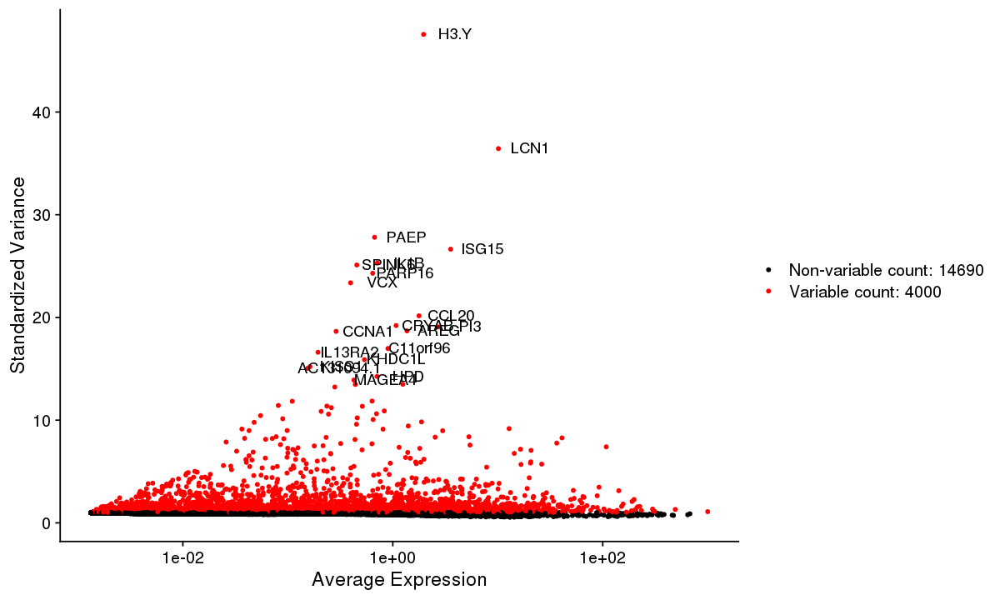

In [14]:
options(repr.plot.width = 10, repr.plot.height = 6)
LabelPoints(plot = VariableFeaturePlot(scdata), points = head(VariableFeatures(scdata), 20))

<h2>4.Dimension reduction: PCA (Scaled data: mean 0 and sd 1;Correction : cellcycle effect, technical effect)</h2>

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



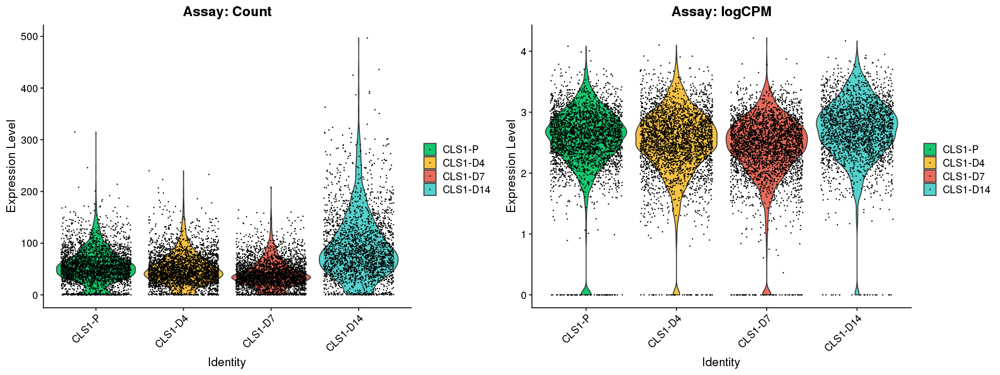

In [15]:
options(repr.plot.width=16, repr.plot.height=6)
MT2A_vp1 <- VlnPlot(scdata, 'LGALS1', assay = "Count", pt.size = 0.1, group.by = 'condition', col = brewer.pal(5, 'Dark2'))+
                    scale_fill_manual(values = color_style)+
                    labs(title = "Assay: Count")
MT2A_vp2 <- VlnPlot(scdata, 'LGALS1', assay = "logCPM", pt.size = 0.1, group.by = 'condition', col = brewer.pal(5, 'Dark2'))+
                    scale_fill_manual(values = color_style)+
                    labs(title = "Assay: logCPM")
plot_grid(MT2A_vp1, MT2A_vp2, ncol=2)

In [16]:
#################################### CellCycle ################################################
scdata <- CellCycleScoring(object = scdata, assay = 'logCPM',
                           g2m.features = cc.genes.updated.2019$g2m.genes, 
                           s.features = cc.genes.updated.2019$s.genes)
################################# Remove CellCycle ################################################
scdata$logCount_logCPM <- log(scdata$nCount_logCPM + 1)
scdata$logpercent.MT <- log(scdata$percent.MT + 1)
scdata <- ScaleData(object = scdata, do.scale = FALSE, verbose = FALSE,
                   vars.to.regress = c('logCount_logCPM', 'logpercent.MT', 'S.Score', 'G2M.Score'))

In [17]:
scdata <- RunPCA(object = scdata, features = VariableFeatures(scdata), verbose = FALSE, assay = 'logCPM', npcs = 100, reduction.name = 'pca')

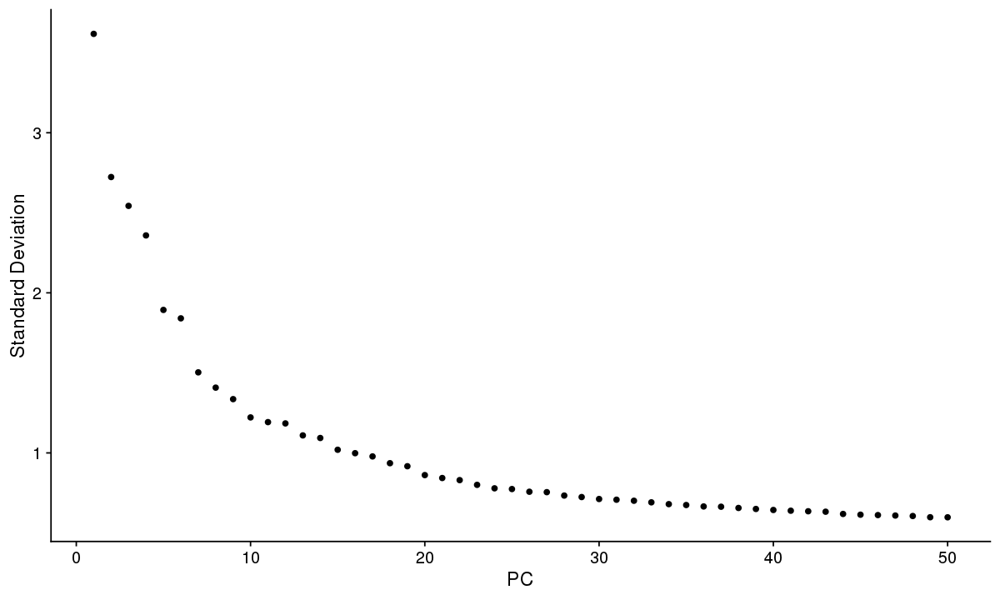

In [18]:
options(repr.plot.width=10, repr.plot.height=6)
ElbowPlot(scdata, ndims = 50)

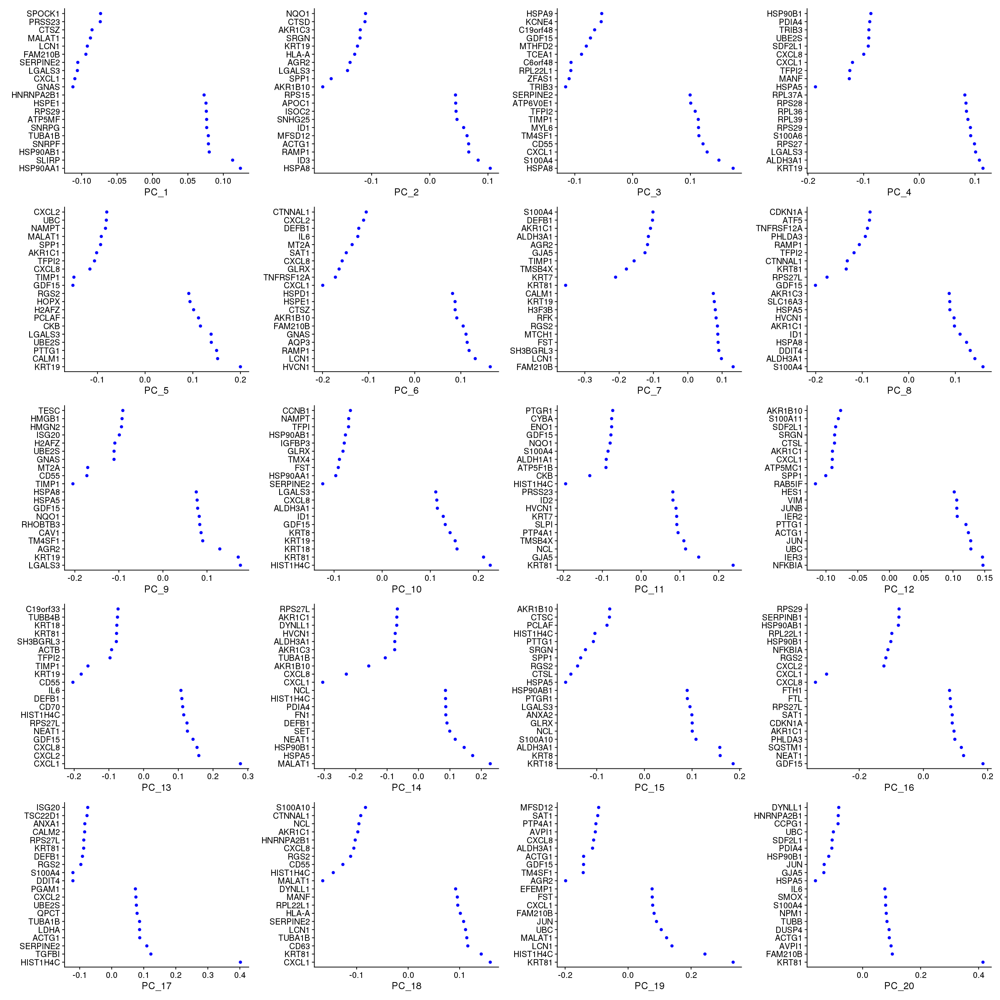

In [19]:
options(repr.plot.width = 20, repr.plot.height = 20)
VizDimLoadings(scdata, dims = 1:20, reduction = "pca", nfeatures = 20, balanced = TRUE, ncol = 4)

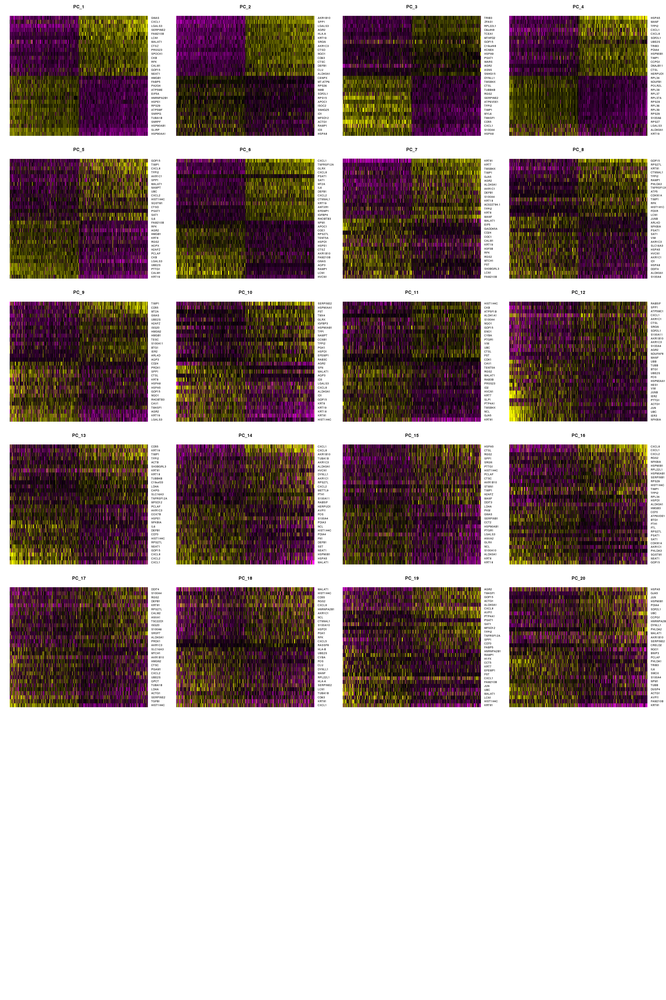

In [20]:
options(repr.plot.width = 20, repr.plot.height = 30)
DimHeatmap(scdata, dims = 1:20, cells = 500, reduction = "pca", balanced = TRUE, ncol = 4)


Attaching package: 'future'


The following object is masked from 'package:SummarizedExperiment':

    values


The following object is masked from 'package:GenomicRanges':

    values


The following object is masked from 'package:IRanges':

    values


The following object is masked from 'package:S4Vectors':

    values


Warning message:
"Removed 309771 rows containing missing values (geom_point)."


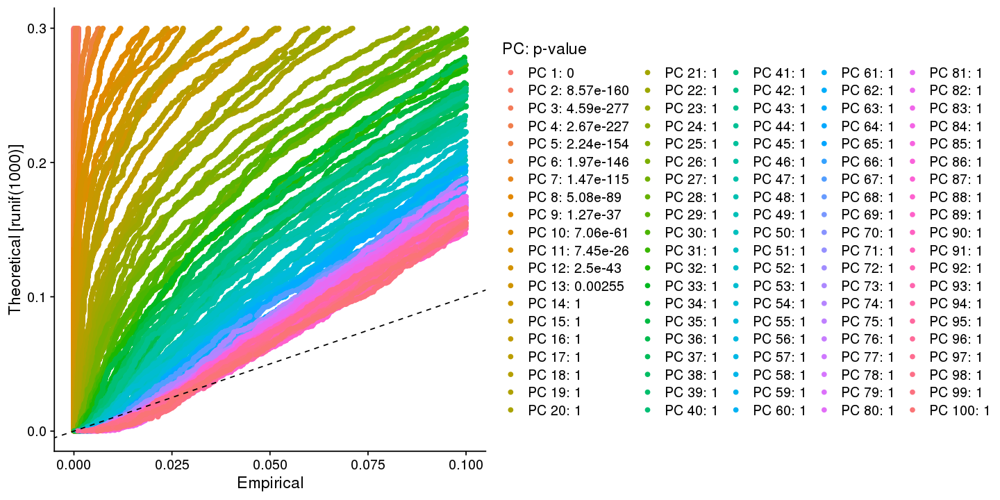

In [21]:
library(future)
plan("multiprocess", workers = 64)
options(repr.plot.width=12, repr.plot.height=6)
scdata <- JackStraw(scdata, num.replicate = 300, dims = 100)
scdata <- ScoreJackStraw(scdata, dims = 1:100)
JackStrawPlot(scdata, dims = 1:100)

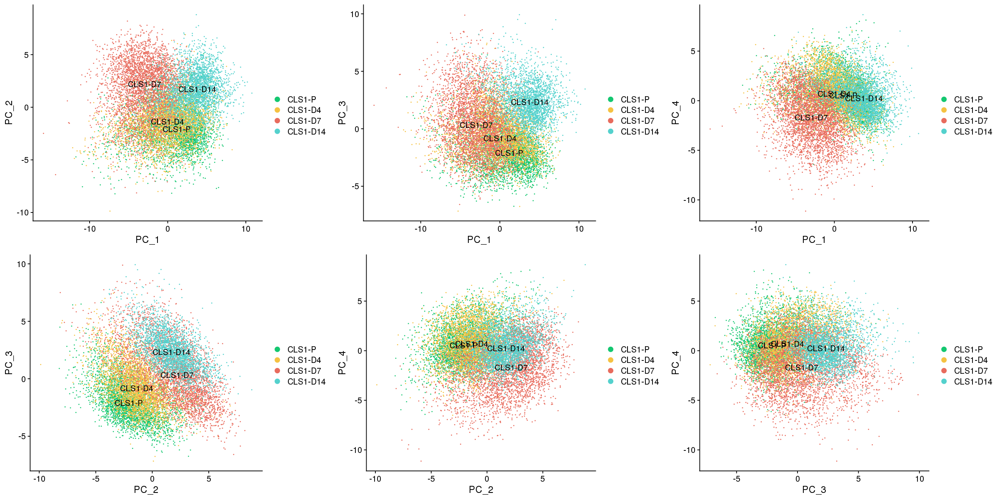

In [22]:
options(repr.plot.width = 20, repr.plot.height = 10)
pcc1 <- DimPlot(object = scdata, reduction = "pca", dims = c(1, 2), group.by = "condition", label = TRUE, cols = color_style)
pcc2 <- DimPlot(object = scdata, reduction = "pca", dims = c(1, 3), group.by = "condition", label = TRUE, cols = color_style)
pcc3 <- DimPlot(object = scdata, reduction = "pca", dims = c(1, 4), group.by = "condition", label = TRUE, cols = color_style)
pcc4 <- DimPlot(object = scdata, reduction = "pca", dims = c(2, 3), group.by = "condition", label = TRUE, cols = color_style)
pcc5 <- DimPlot(object = scdata, reduction = "pca", dims = c(2, 4), group.by = "condition", label = TRUE, cols = color_style)
pcc6 <- DimPlot(object = scdata, reduction = "pca", dims = c(3, 4), group.by = "condition", label = TRUE, cols = color_style)
plot_grid(pcc1, pcc2, pcc3, pcc4, pcc5, pcc6, ncol = 3)

<h2>5.Cell Cycle</h2>

In [23]:
# scdata <- CellCycleScoring(object = scdata, assay = 'logCPM',
#                            g2m.features = cc.genes.updated.2019$g2m.genes, 
#                            s.features = cc.genes.updated.2019$s.genes)

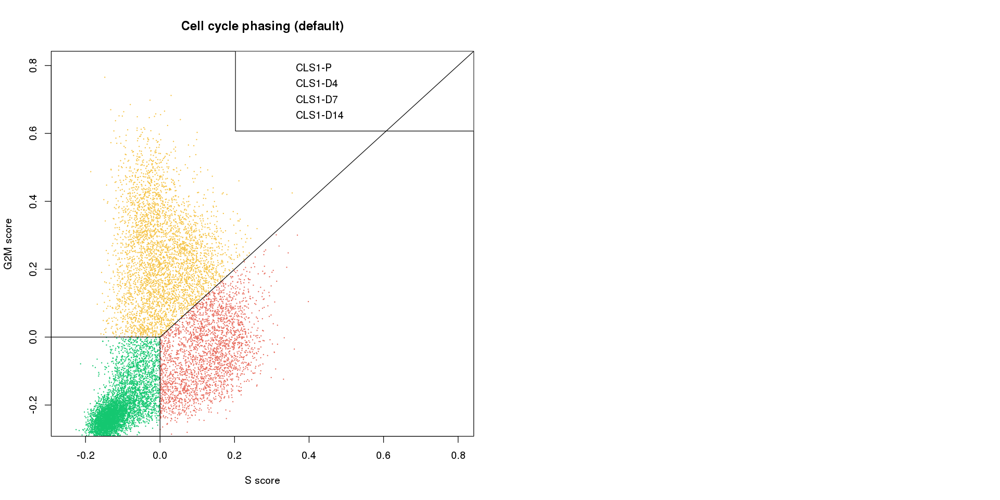

In [24]:
options(repr.plot.width = 16, repr.plot.height = 8)
par(mfrow = c(1, 2))
plot(cbind(scdata$S.Score, scdata$G2M.Score),
     cex = 0.2, pch = 20, xlab = 'S score', ylab = 'G2M score', main = 'Cell cycle phasing (default)', xlim = c(-0.25, 0.8), ylim = c(-0.25, 0.8),
     col = color_style[factor(scdata$Phase)])
legend("topright", legend=order_list, col = color_style)
rect(-10, -10, 0, 0)
segments(0, 0, 1, 1)

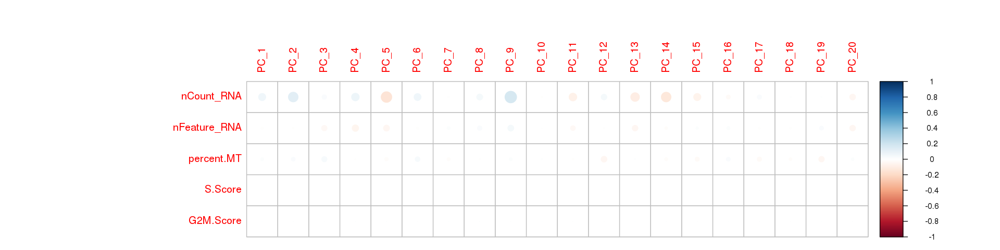

In [25]:
options(repr.plot.width = 16, repr.plot.height = 4)
cor.pca.meta <- cor(scdata@reductions$pca@cell.embeddings[, 1:20], scdata@meta.data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score')])#, method = 'spear')
corrplot(t(cor.pca.meta), method = "circle")

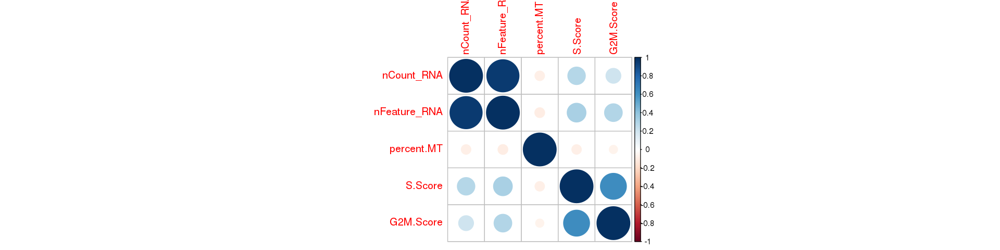

In [26]:
options(repr.plot.width = 16, repr.plot.height = 4)
cor.meta <- cor(scdata@meta.data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score')], scdata@meta.data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score')], method = 'spear')
corrplot(cor.meta, method = "circle")

In [27]:
saveRDS(scdata, file = '/mnt/isilonX200/scRNA/Project_1/Result/CLS1.merge.noc.Rds')

In [28]:
head(scdata[[]])

,orig.ident,nCount_RNA,nFeature_RNA,condition,percent.MT,nCount_logCPM,nFeature_logCPM,S.Score,G2M.Score,Phase,logCount_logCPM,logpercent.MT
,<chr>,<dbl>,<int>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>
AAACCTGCAGCTGTTA-1-CLS1-P,Project_1,63930,6457,CLS1-P,3.789846,63930,6457,0.001560492,-0.1480272,S,11.06556,1.566498
AAACCTGGTACCAGTT-1-CLS1-P,Project_1,62556,6105,CLS1-P,3.425566,62556,6105,-0.098258818,-0.1078782,G1,11.04383,1.487398
AAACCTGGTGCTCTTC-1-CLS1-P,Project_1,70420,6131,CLS1-P,3.899405,70420,6131,0.160946626,0.1303697,S,11.16225,1.589114
AAACCTGTCCACTCCA-1-CLS1-P,Project_1,45542,5831,CLS1-P,3.383244,45542,5831,-0.014159768,0.3309562,G2M,10.72641,1.477789
AAACGGGAGAGATGAG-1-CLS1-P,Project_1,60172,6029,CLS1-P,4.039817,60172,6029,-0.170950018,-0.2632159,G1,11.00498,1.617370
AAACGGGAGGATCGCA-1-CLS1-P,Project_1,36871,5410,CLS1-P,4.716444,36871,5410,-0.110692325,0.5037937,G2M,10.51521,1.743347


<h2>6.Visualization: tSNE, UMAP</h>

In [29]:
pc <- 13
scdata <- RunUMAP(scdata, reduction = "pca", dims = 1:pc)
scdata <- RunTSNE(scdata, reduction = "pca", dims = 1:pc, max_iter = 2000)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
03:42:43 UMAP embedding parameters a = 0.9922 b = 1.112

03:42:43 Read 11997 rows and found 13 numeric columns

03:42:43 Using Annoy for neighbor search, n_neighbors = 30

03:42:43 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

03:42:46 Writing NN index file to temp file /tmp/RtmpCt5pxl/fileb4025eb66a64

03:42:46 Searching Annoy index using 64 threads, search_k = 3000

03:42:46 Annoy recall = 100%

03:42:48 Commencing smooth kNN distance calibration using 64 threads

03:42:50 Initializi

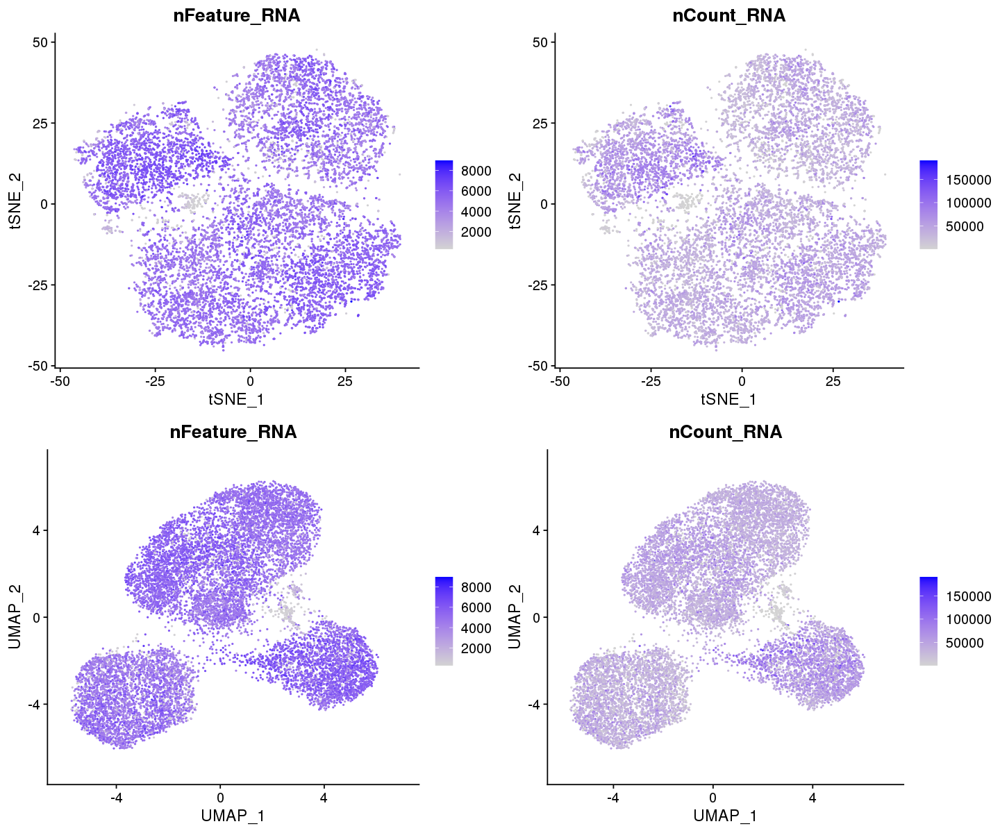

In [30]:
options(repr.plot.width=12, repr.plot.height=10)
fp1 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "tsne")
fp2 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "tsne")
fp3 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "umap")
fp4 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "umap")
plot_grid(fp1, fp2, fp3, fp4, ncol = 2, nrow = 2)

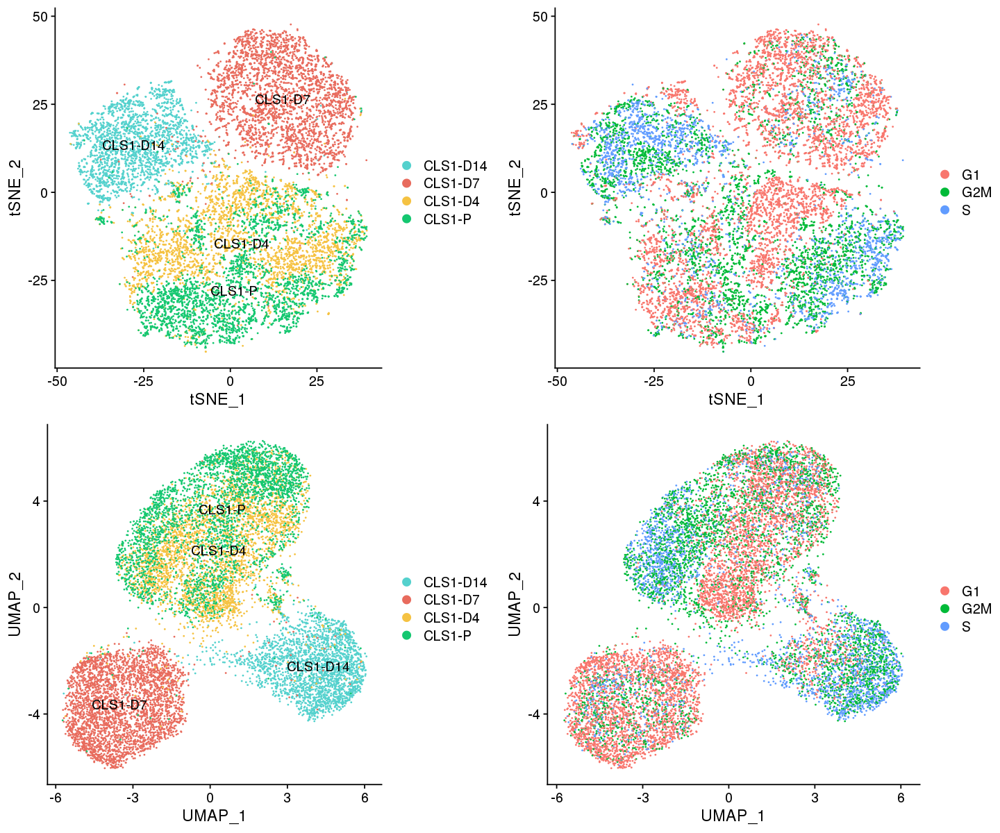

In [31]:
options(repr.plot.width=12, repr.plot.height=10)
tp1 <- DimPlot(object = scdata, reduction = "tsne", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
tp2 <- DimPlot(object = scdata, reduction = "tsne", group.by = "Phase")
up1 <- DimPlot(object = scdata, reduction = "umap", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
up2 <- DimPlot(object = scdata, reduction = "umap", group.by = "Phase") 
plot_grid(tp1, tp2, up1, up2, ncol=2)

### Resolution

In [32]:
resolutions <- seq(0, 1.2, 0.1) 
pc <- 13

In [33]:
scdata <- FindNeighbors(object = scdata, reduction = "pca", dims = 1:pc)
scdata <- FindClusters(scdata, resolution = resolutions)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11997
Number of edges: 368062

Running Louvain algorithm...
Maximum modularity in 10 random starts: 1.0000
Number of communities: 1
Elapsed time: 2 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11997
Number of edges: 368062

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9484
Number of communities: 3
Elapsed time: 2 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11997
Number of edges: 368062

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9138
Number of communities: 6
Elapsed time: 1 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11997
Number of edges: 368062

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8890
Number of communities: 5
Elapsed time: 1 seconds
Modularity Optim

In [34]:
head(scdata@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,condition,percent.MT,nCount_logCPM,nFeature_logCPM,S.Score,G2M.Score,Phase,...,logCPM_snn_res.0.4,logCPM_snn_res.0.5,logCPM_snn_res.0.6,logCPM_snn_res.0.7,logCPM_snn_res.0.8,logCPM_snn_res.0.9,logCPM_snn_res.1,logCPM_snn_res.1.1,logCPM_snn_res.1.2,seurat_clusters
,<chr>,<dbl>,<int>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<fct>,...,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AAACCTGCAGCTGTTA-1-CLS1-P,Project_1,63930,6457,CLS1-P,3.789846,63930,6457,0.001560492,-0.1480272,S,...,3,3,3,2,1,0,5,2,5,5
AAACCTGGTACCAGTT-1-CLS1-P,Project_1,62556,6105,CLS1-P,3.425566,62556,6105,-0.098258818,-0.1078782,G1,...,1,1,1,0,3,1,0,12,12,12
AAACCTGGTGCTCTTC-1-CLS1-P,Project_1,70420,6131,CLS1-P,3.899405,70420,6131,0.160946626,0.1303697,S,...,3,3,3,2,1,0,6,7,7,7
AAACCTGTCCACTCCA-1-CLS1-P,Project_1,45542,5831,CLS1-P,3.383244,45542,5831,-0.014159768,0.3309562,G2M,...,1,1,1,0,3,1,0,5,0,0
AAACGGGAGAGATGAG-1-CLS1-P,Project_1,60172,6029,CLS1-P,4.039817,60172,6029,-0.170950018,-0.2632159,G1,...,4,4,4,4,4,4,3,4,4,4
AAACGGGAGGATCGCA-1-CLS1-P,Project_1,36871,5410,CLS1-P,4.716444,36871,5410,-0.110692325,0.5037937,G2M,...,3,3,3,2,1,0,6,7,7,7


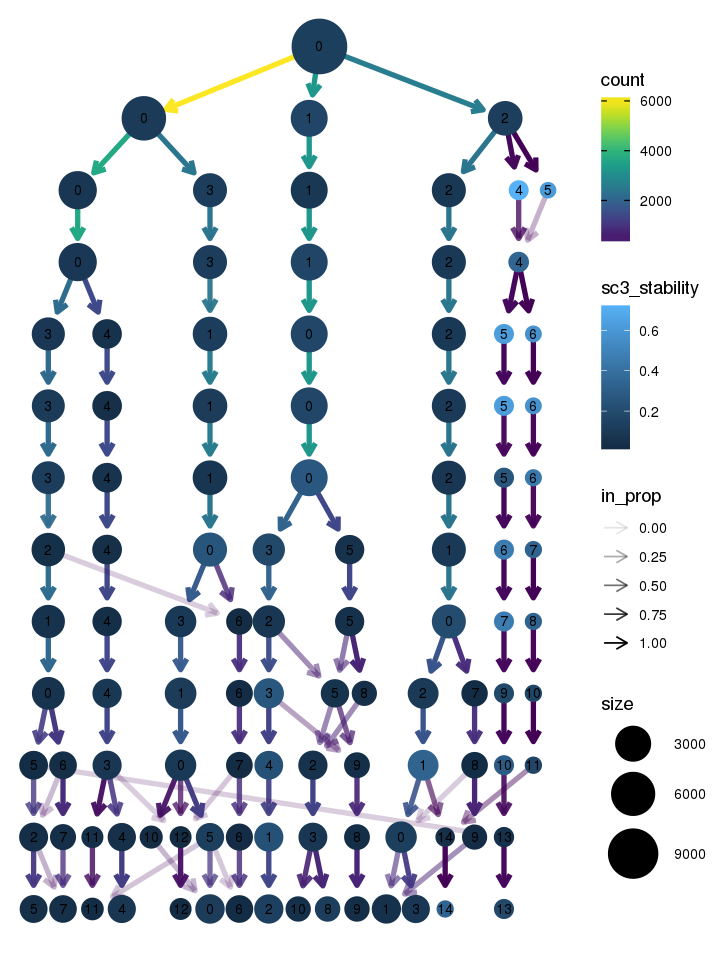

In [35]:
options(repr.plot.width=6, repr.plot.height=8)
clustree(scdata, node_colour = "sc3_stability")

In [37]:
# 用來算clustree每一層也就是分幾群的時候分數最高 
# :: 是用來找一個package下的某個function, :::是用來找一個package下的某個隱藏function
tmp <- clustree:::calc_sc3_stability(scdata[[]][,13:26])
# 標準差 / 平均值 / 變異係數
data.frame(tmp) %>% group_by(resolution) %>% summarise(sum(stability),sd(stability),mean(stability),sd(stability)/mean(stability)) 

resolution,sum(stability),sd(stability),mean(stability),sd(stability)/mean(stability)
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.1242089,NA,0.12420893,NA
2,0.3818486,0.02710679,0.12728288,0.2129649
3,1.7343433,0.31017790,0.28905721,1.0730675
4,0.8050489,0.11080745,0.16100977,0.6882033
5,1.7566666,0.25724974,0.25095237,1.0250939
6,1.7592105,0.25722264,0.25131578,1.0235037
7,1.3642057,0.15986223,0.19488653,0.8202836
8,1.5355288,0.17202939,0.19194109,0.8962614
9,1.4153249,0.17142557,0.15725833,1.0900890


In [38]:
pc <- 13
scdata <- FindNeighbors(object = scdata, reduction = "pca", dims = 1:pc)
scdata <- FindClusters(scdata, resolution = 0.6)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11997
Number of edges: 368062

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8254
Number of communities: 7
Elapsed time: 2 seconds


In [39]:
reduction_name <- "res0.6"
scdata <- RunUMAP(scdata, reduction = "pca",reduction.name = paste0("umap_", reduction_name, '_pc'), dims = 1:pc)
scdata <- RunTSNE(scdata, reduction = "pca", reduction.name = paste0("tsne_", reduction_name, '_pc'), dims = 1:pc, max_iter = 2000)

04:07:45 UMAP embedding parameters a = 0.9922 b = 1.112

04:07:45 Read 11997 rows and found 13 numeric columns

04:07:45 Using Annoy for neighbor search, n_neighbors = 30

04:07:45 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

04:07:48 Writing NN index file to temp file /tmp/RtmpCt5pxl/fileb4022ad6d0f

04:07:48 Searching Annoy index using 64 threads, search_k = 3000

04:07:48 Annoy recall = 100%

04:07:50 Commencing smooth kNN distance calibration using 64 threads

04:07:53 Initializing from normalized Laplacian + noise

04:07:53 Commencing optimization for 200 epochs, with 486634 positive edges

04:08:07 Optimization finished

Warning message:
"Cannot add objects with duplicate keys (offending key: UMAP_), setting key to 'umap_res0.6_pc_'"
Warning message:
"Cannot 

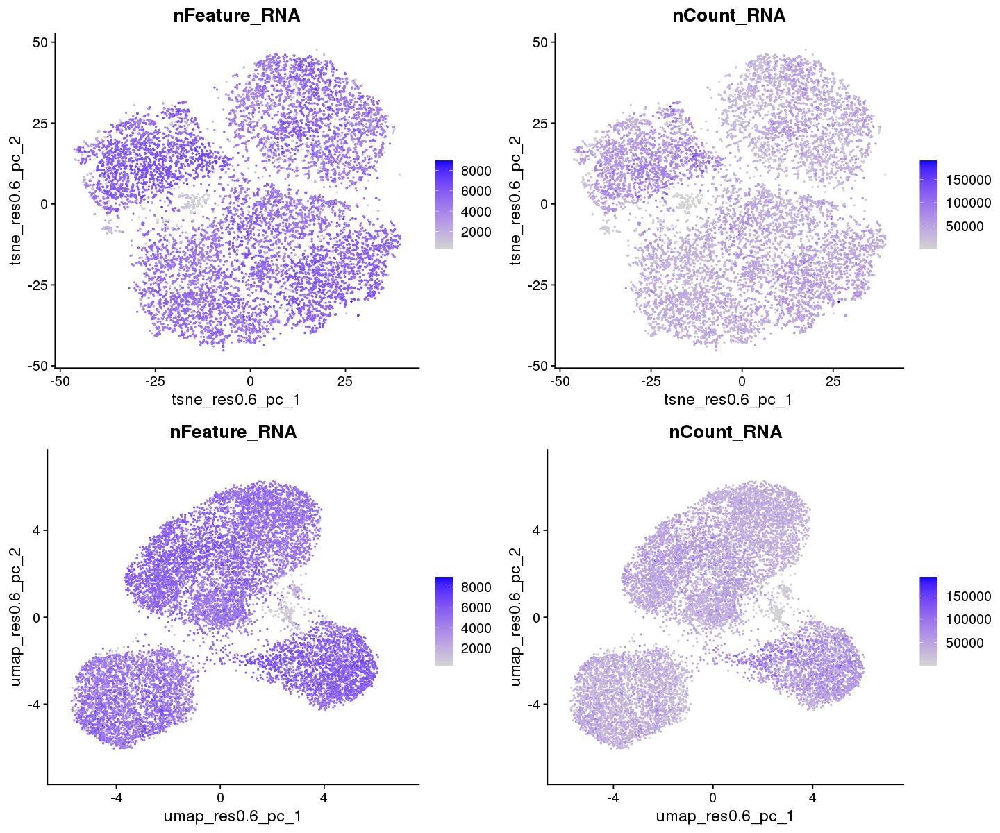

In [40]:
options(repr.plot.width=12, repr.plot.height=10)
fp1 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "tsne_res0.6_pc")
fp2 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "tsne_res0.6_pc")
fp3 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "umap_res0.6_pc")
fp4 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "umap_res0.6_pc")
plot_grid(fp1, fp2, fp3, fp4, ncol = 2, nrow = 2)

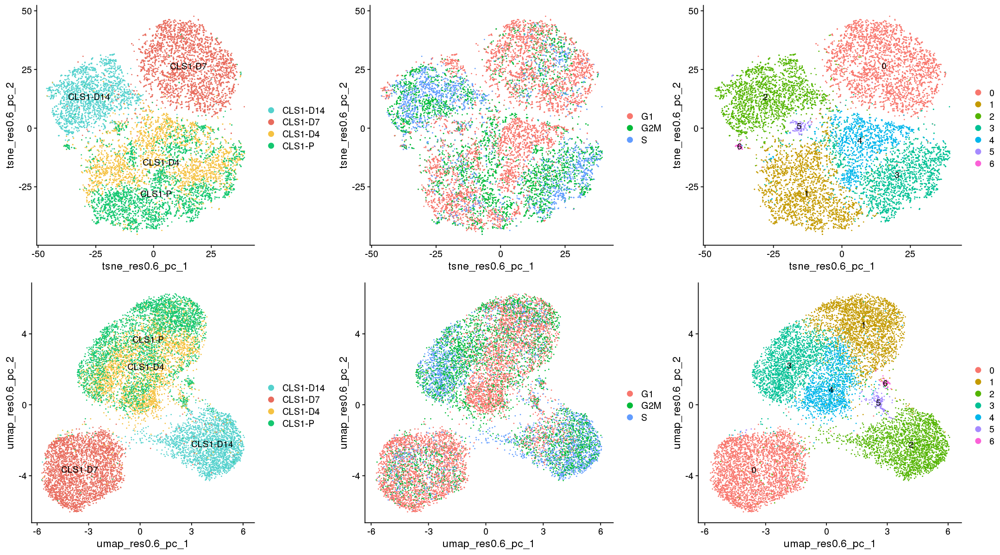

In [41]:
options(repr.plot.width=18, repr.plot.height=10)
tp1 <- DimPlot(object = scdata, reduction = "tsne_res0.6_pc", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
tp2 <- DimPlot(object = scdata, reduction = "tsne_res0.6_pc", group.by = "Phase")
tp3 <- DimPlot(object = scdata, reduction = "tsne_res0.6_pc", label = TRUE)
up1 <- DimPlot(object = scdata, reduction = "umap_res0.6_pc", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
up2 <- DimPlot(object = scdata, reduction = "umap_res0.6_pc", group.by = "Phase")
up3 <- DimPlot(object = scdata, reduction = "umap_res0.6_pc", label = TRUE)
plot_grid(tp1, tp2, tp3,up1, up2, up3, ncol=3)

In [42]:
plot.data <- scdata@meta.data %>%
    select(condition, cluster = logCPM_snn_res.0.6) %>%
    mutate(cluster = factor(cluster)) %>%
    mutate(condition = factor(condition, levels = order_list))%>%
    group_by(cluster, condition) %>%
    summarise(count = n()) %>%
    mutate(clust_total = sum(count)) %>%
    mutate(clust_prop = count / clust_total) %>%
    group_by(condition) %>%
    mutate(dataset_total = sum(count)) %>%
    ungroup() %>%
    mutate(dataset_prop = count / dataset_total)

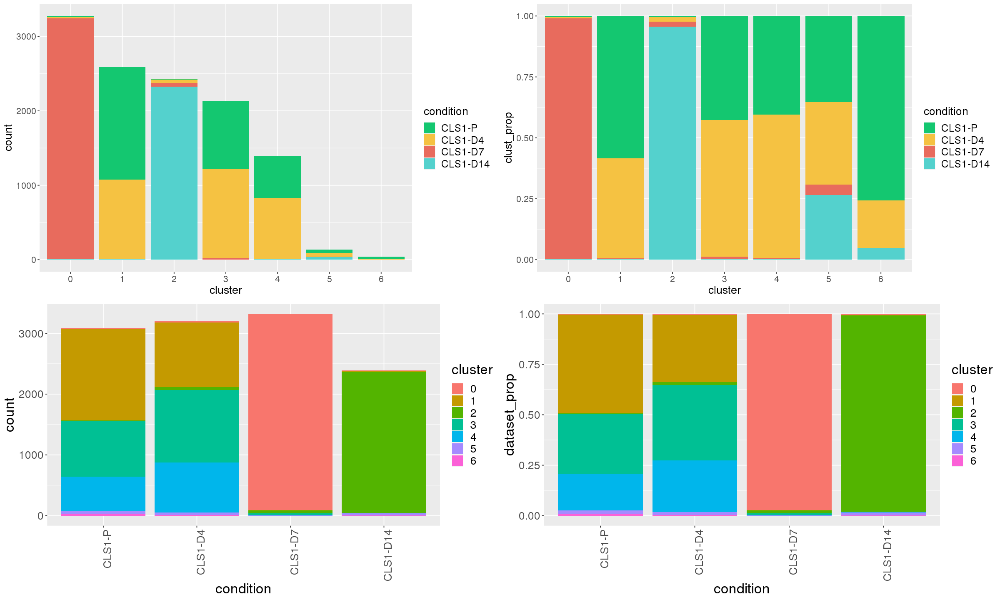

In [43]:
options(repr.plot.width=20, repr.plot.height=12)

gp1<-ggplot(plot.data, aes(x = cluster, y = count, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gp2<-ggplot(plot.data, aes(x = cluster, y = clust_prop, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gp3<-ggplot(plot.data, aes(x = condition, y = count, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

gp4<-ggplot(plot.data, aes(x = condition, y = dataset_prop, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

plot_grid(gp1, gp2, gp3, gp4, ncol = 2)

In [44]:
saveRDS(file ="/mnt/isilonX200/scRNA/Project_1/Result/CLS1.merge.noc.Rds", object = scdata)

<h2>7.Different Expression</h>

In [45]:
# Idents(scdata) <- scdata@meta.data$logCPM_snn_res.0.6
scdata.markers <- FindAllMarkers(object = scdata, features = VariableFeatures(scdata)) 
top20 = scdata.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6



In [46]:
head(top20)

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0,1.3665150,0.853,0.469,0,0,LCN1
0,1.3462676,0.981,0.947,0,0,CXCL1
0,1.0216548,0.984,0.964,0,0,HSPA5
0,0.9682523,0.746,0.381,0,0,RAMP1
0,0.9290171,0.970,0.946,0,0,MANF
0,0.7772493,0.963,0.945,0,0,SDF2L1


In [47]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = scdata,
    slot = 'scale.data')[top20$gene ,cells <- colnames(x = scdata)]))))

annotation_col <- scdata@meta.data[,c("condition", "logCPM_snn_res.0.6"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$logCPM_snn_res.0.6),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

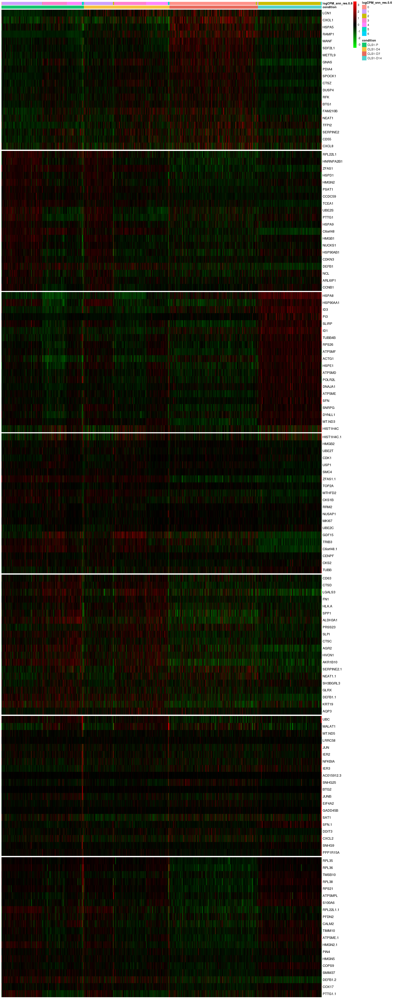

In [48]:
options(repr.plot.width = 18, repr.plot.height = 45)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(top20$cluster)),
         gaps_col = cumsum(table(annotation_col$seurat_clusters)),
         color = greenred(100),
         fontsize_row=11
         )

<h2>8.Pesudotime Analysis</h2>

In [47]:
# scdata <- readRDS(file ="/mnt/isilonX200/scRNA/Project_1/Result/CLS1.merge.noc.Rds")

In [49]:
data <- as(as.matrix(scdata@assays$logCPM@counts), 'sparseMatrix')
pd <- new('AnnotatedDataFrame', data = scdata@meta.data)
fData <- data.frame(gene_short_name = row.names(data), row.names = row.names(data))
fd <- new('AnnotatedDataFrame', data = fData)
#Construct monocle cds
monocle_cds <- newCellDataSet(data,
                              phenoData = pd,
                              featureData = fd,
                              lowerDetectionLimit = 0.5,
                              expressionFamily = negbinomial.size())

In [50]:
CL10.M <- monocle_cds
CL10.M <- estimateSizeFactors(CL10.M)
CL10.M <- estimateDispersions(CL10.M)

Removing 133 outliers

Warning message:
"glm.fit: algorithm did not converge"
Warning message in parametricDispersionFit(disp_table[row.names(disp_table) %in% :
"Dispersion fit did not converge."


In [51]:
CL10.M <- detectGenes(CL10.M, min_expr = 3 )

In [52]:
saveRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CLS1.monocle.noc.Rds", object = CL10.M)
# CL10.M <- readRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CLS1.monocle.noc.Rds")

In [53]:
str(CL10.M)

Formal class 'CellDataSet' [package "monocle"] with 19 slots
  ..@ reducedDimS          : num[0 , 0 ] 
  ..@ reducedDimW          : num[0 , 0 ] 
  ..@ reducedDimA          : num[0 , 0 ] 
  ..@ reducedDimK          : num[0 , 0 ] 
  ..@ minSpanningTree      :Formal class 'igraph' [package "monocle"] with 1 slot
  .. .. ..@ .S3Class: chr "igraph"
  ..@ cellPairwiseDistances: num[0 , 0 ] 
  ..@ expressionFamily     :Formal class 'vglmff' [package "VGAM"] with 22 slots
  .. .. ..@ blurb             : chr [1:6] "Negative-binomial distribution with size known\n\n" "Links:    " "loglink(mu)" "\n" ...
  .. .. ..@ constraints       :  expression({  constraints <- cm.zero.VGAM(constraints, x = x, NULL, M = M, predictors.names = predictors.names,  M1 = 2) })
  .. .. ..@ deviance          :function ()  
  .. .. ..@ fini              :  expression({ })
  .. .. ..@ first             :  expression({ })
  .. .. ..@ infos             :function (...)  
  .. .. ..@ initialize        :  expression({  M1 <-

In [54]:
head(fData(CL10.M)[order(-fData(CL10.M)$num_cells_expressed),])

,gene_short_name,num_cells_expressed
,<fct>,<int>
FTL,FTL,11990
RPLP1,RPLP1,11958
RPS2,RPS2,11956
RPL13,RPL13,11942
FTH1,FTH1,11923
RPL10,RPL10,11880


In [55]:
expressed_genes <- rownames(subset(fData(CL10.M), num_cells_expressed >= 10))
head(expressed_genes)

[1] "SAMD11" "NOC2L"  "HES4"   "ISG15"  "AGRN"   "SDF4"

In [56]:
print(head(pData(CL10.M)[,c(0:5)]))

                          orig.ident nCount_RNA nFeature_RNA condition
AAACCTGCAGCTGTTA-1-CLS1-P  Project_1      63930         6457    CLS1-P
AAACCTGGTACCAGTT-1-CLS1-P  Project_1      62556         6105    CLS1-P
AAACCTGGTGCTCTTC-1-CLS1-P  Project_1      70420         6131    CLS1-P
AAACCTGTCCACTCCA-1-CLS1-P  Project_1      45542         5831    CLS1-P
AAACGGGAGAGATGAG-1-CLS1-P  Project_1      60172         6029    CLS1-P
AAACGGGAGGATCGCA-1-CLS1-P  Project_1      36871         5410    CLS1-P
                          percent.MT
AAACCTGCAGCTGTTA-1-CLS1-P   3.789846
AAACCTGGTACCAGTT-1-CLS1-P   3.425566
AAACCTGGTGCTCTTC-1-CLS1-P   3.899405
AAACCTGTCCACTCCA-1-CLS1-P   3.383244
AAACGGGAGAGATGAG-1-CLS1-P   4.039817
AAACGGGAGGATCGCA-1-CLS1-P   4.716444


In [57]:
diff_test_res <- differentialGeneTest(CL10.M, fullModelFormulaStr = "~logCPM_snn_res.0.6") 

In [58]:
head(diff_test_res)
ordering_genes <- row.names (subset(diff_test_res, qval < 0.01))
head(ordering_genes)

,status,family,pval,qval,gene_short_name,num_cells_expressed
,<fct>,<fct>,<dbl>,<dbl>,<fct>,<int>
AL627309.1,OK,negbinomial.size,5.766242e-01,6.602406e-01,AL627309.1,0
AL669831.5,OK,negbinomial.size,4.282574e-03,6.611160e-03,AL669831.5,0
LINC00115,OK,negbinomial.size,6.300120e-11,1.609476e-10,LINC00115,0
FAM41C,OK,negbinomial.size,2.325685e-05,4.308360e-05,FAM41C,0
AL645608.3,OK,negbinomial.size,5.259645e-01,6.095539e-01,AL645608.3,0
AL645608.5,OK,negbinomial.size,8.861565e-01,9.356816e-01,AL645608.5,0


[1] "AL669831.5" "LINC00115"  "FAM41C"     "AL645608.1" "SAMD11"    
[6] "NOC2L"

In [59]:
CL10.M <- setOrderingFilter(CL10.M, rownames(CL10.M))

In [60]:
CL10.M.order <- setOrderingFilter(CL10.M, ordering_genes)

In [61]:
print(paste0(length(rownames(CL10.M)), "=>", length(rownames(CL10.M[setdiff(rownames(CL10.M), ordering_genes),])), "=>", length(rownames(CL10.M[ordering_genes,]))))

[1] "18690=>6352=>12338"


Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"


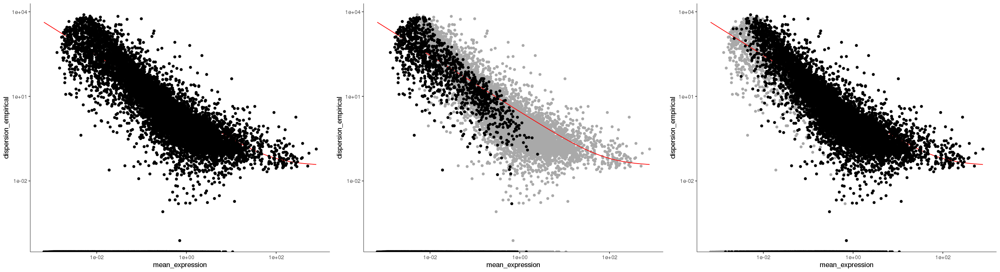

In [62]:
options(repr.plot.width=22, repr.plot.height=6)
pog1 <- plot_ordering_genes(CL10.M)
pog2 <- plot_ordering_genes(CL10.M[setdiff(rownames(CL10.M), ordering_genes),])
pog3 <- plot_ordering_genes(CL10.M.order)
plot_grid(pog1, pog2, pog3, ncol=3)

In [63]:
str(CL10.M)

Formal class 'CellDataSet' [package "monocle"] with 19 slots
  ..@ reducedDimS          : num[0 , 0 ] 
  ..@ reducedDimW          : num[0 , 0 ] 
  ..@ reducedDimA          : num[0 , 0 ] 
  ..@ reducedDimK          : num[0 , 0 ] 
  ..@ minSpanningTree      :Formal class 'igraph' [package "monocle"] with 1 slot
  .. .. ..@ .S3Class: chr "igraph"
  ..@ cellPairwiseDistances: num[0 , 0 ] 
  ..@ expressionFamily     :Formal class 'vglmff' [package "VGAM"] with 22 slots
  .. .. ..@ blurb             : chr [1:6] "Negative-binomial distribution with size known\n\n" "Links:    " "loglink(mu)" "\n" ...
  .. .. ..@ constraints       :  expression({  constraints <- cm.zero.VGAM(constraints, x = x, NULL, M = M, predictors.names = predictors.names,  M1 = 2) })
  .. .. ..@ deviance          :function ()  
  .. .. ..@ fini              :  expression({ })
  .. .. ..@ first             :  expression({ })
  .. .. ..@ infos             :function (...)  
  .. .. ..@ initialize        :  expression({  M1 <-

In [64]:
CL10.M.order <- reduceDimension(CL10.M.order, max_components = 2, reduction_method = "DDRTree")
CL10.M.order <- orderCells(CL10.M.order)

In [65]:
length(rownames(pData(CL10.M.order)))

[1] 11997

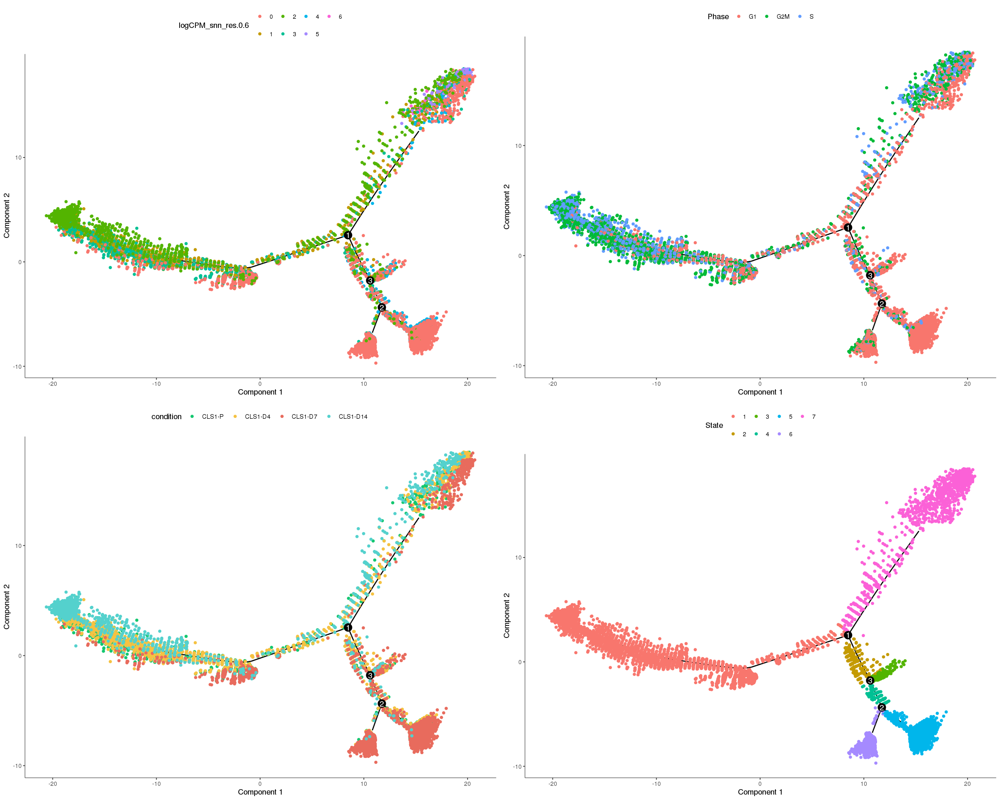

In [66]:
options(repr.plot.width=20, repr.plot.height=16)
trajectoryplot1 <- plot_cell_trajectory(CL10.M.order, color_by = "logCPM_snn_res.0.6")
trajectoryplot2 <- plot_cell_trajectory(CL10.M.order, color_by = "Phase")
trajectoryplot3 <- plot_cell_trajectory(CL10.M.order, color_by = "condition") + 
                   scale_color_manual(values = color_style, breaks = order_list)
trajectoryplot4 <- plot_cell_trajectory(CL10.M.order, color_by = "State", order = order_list, cols = color_style)
plot_grid(trajectoryplot1, trajectoryplot2, trajectoryplot3, trajectoryplot4, ncol=2)

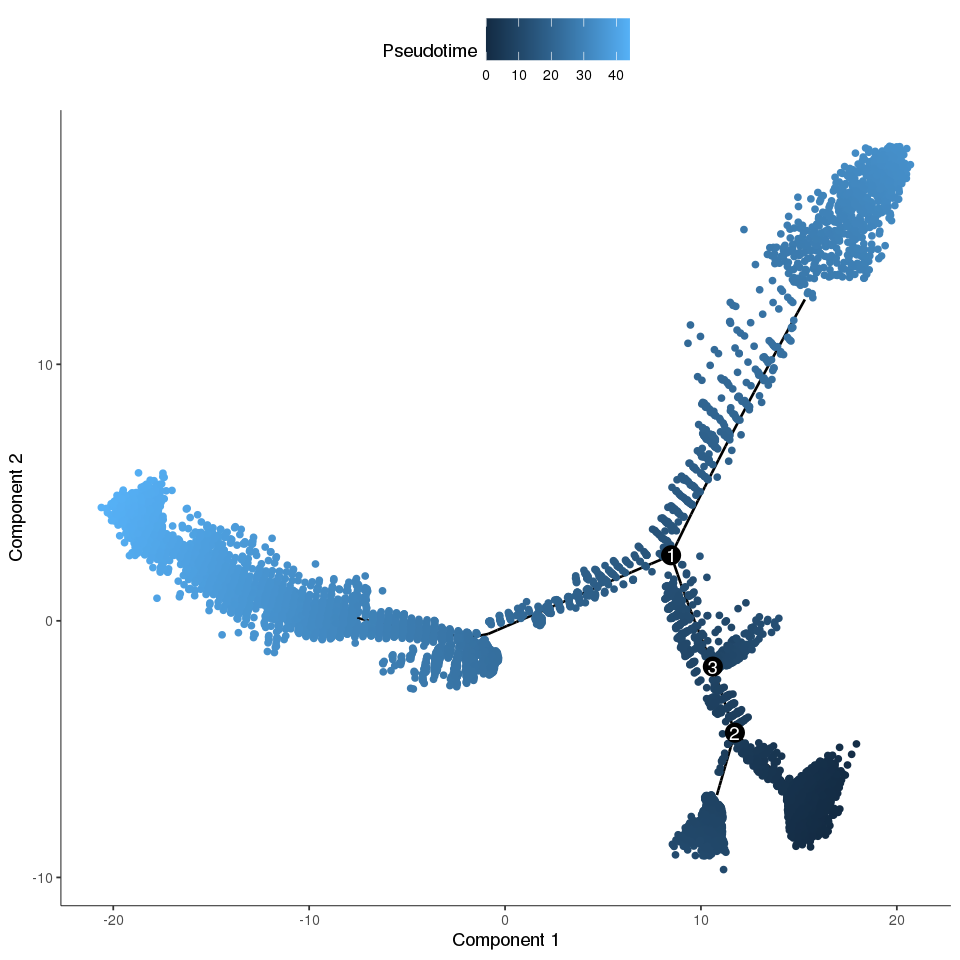

In [67]:
options(repr.plot.width=8, repr.plot.height=8)
GM_state <- function(CL10.M.order){
  if (length(unique(pData(CL10.M.order)$State)) > 1){
    T0_counts <- table(pData(CL10.M.order)$State, pData(CL10.M.order)$seurat_clusters)[,"0"]
    return(as.numeric(names(T0_counts)[which(T0_counts == max(T0_counts))]))
  } else {
    return (1)
  }
}
CL10.M.order <- orderCells(CL10.M.order, root_state = GM_state(CL10.M.order))
plot_cell_trajectory(CL10.M.order, color_by = "Pseudotime")

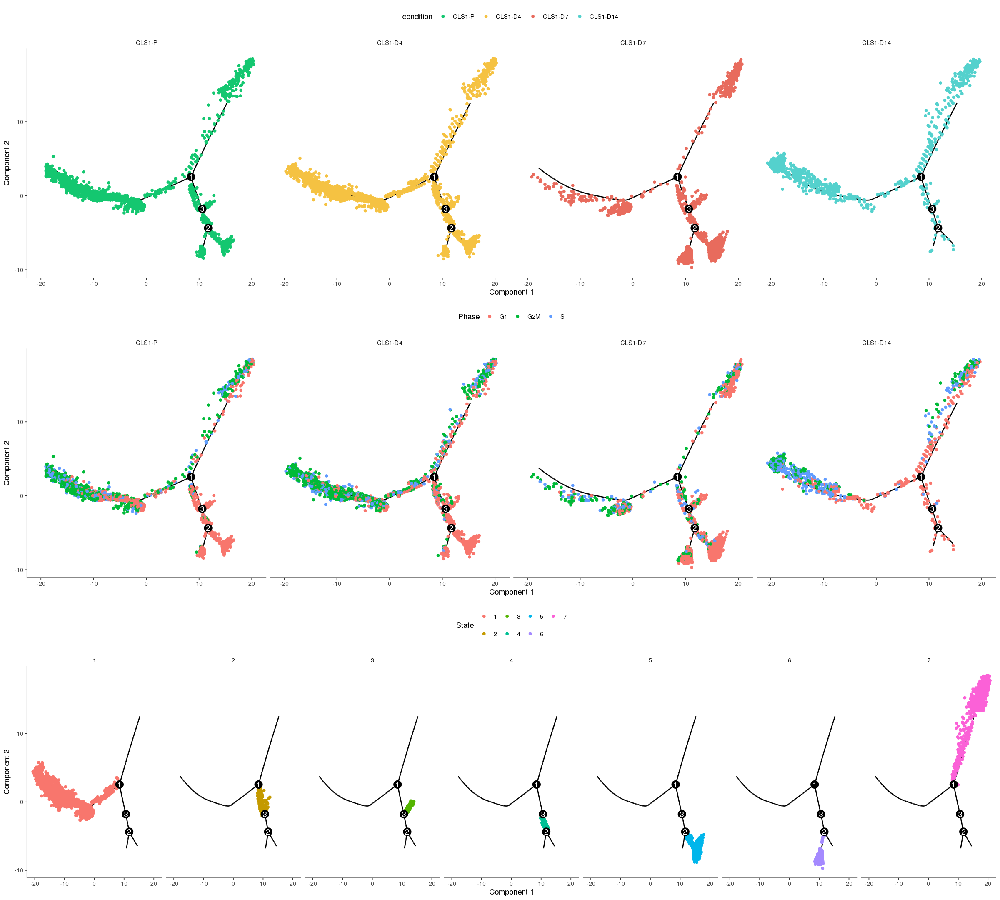

In [68]:
CL10.M.order@phenoData@data$condition<-factor(CL10.M.order@phenoData@data$condition, levels = order_list)
options(repr.plot.width=20, repr.plot.height=18)
facet.trajectory.plot1 <- plot_cell_trajectory(CL10.M.order, color_by = "condition")+
                          scale_color_manual(values = color_style, breaks = order_list)+
                          facet_wrap(~condition, nrow = 1)
facet.trajectory.plot2 <- plot_cell_trajectory(CL10.M.order, color_by = "Phase")+
                          facet_wrap(~condition, nrow = 1)
facet.trajectory.plot3 <- plot_cell_trajectory(CL10.M.order, color_by = "State") +
                          facet_wrap(~State, nrow = 1)
plot_grid(facet.trajectory.plot1, facet.trajectory.plot2, facet.trajectory.plot3, ncol=1)

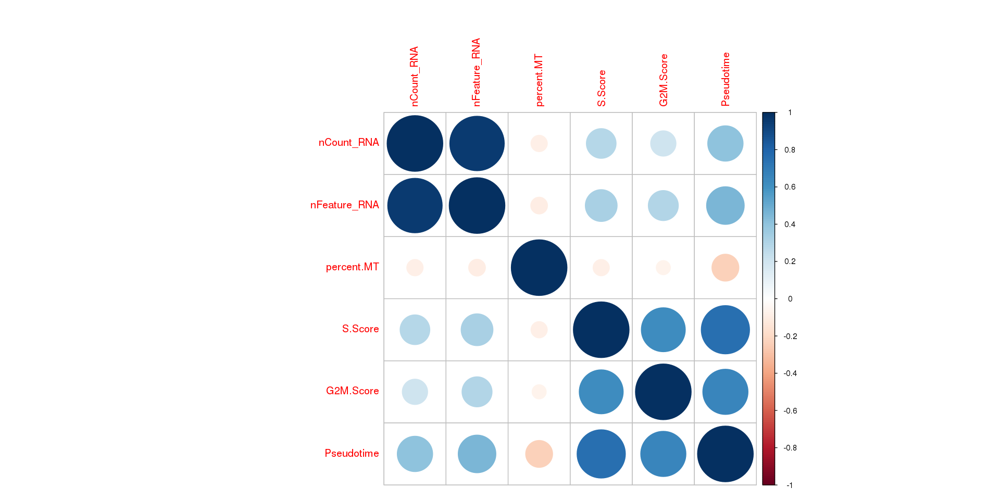

In [69]:
options(repr.plot.width = 16, repr.plot.height = 8)
cor.meta <- cor(CL10.M.order@phenoData@data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score', "Pseudotime")], CL10.M.order@phenoData@data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score', "Pseudotime")], method = 'spear')
corrplot(cor.meta, method = "circle")

In [70]:
head(CL10.M.order@phenoData@data)

,orig.ident,nCount_RNA,nFeature_RNA,condition,percent.MT,nCount_logCPM,nFeature_logCPM,S.Score,G2M.Score,Phase,...,logCPM_snn_res.0.8,logCPM_snn_res.0.9,logCPM_snn_res.1,logCPM_snn_res.1.1,logCPM_snn_res.1.2,seurat_clusters,Size_Factor,num_genes_expressed,Pseudotime,State
,<chr>,<dbl>,<int>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<fct>,...,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<int>,<dbl>,<fct>
AAACCTGCAGCTGTTA-1-CLS1-P,Project_1,63930,6457,CLS1-P,3.789846,63930,6457,0.001560492,-0.1480272,S,...,1,0,5,2,5,3,1.876397,1993,23.98952,1
AAACCTGGTACCAGTT-1-CLS1-P,Project_1,62556,6105,CLS1-P,3.425566,62556,6105,-0.098258818,-0.1078782,G1,...,3,1,0,12,12,1,1.836069,2104,32.34601,1
AAACCTGGTGCTCTTC-1-CLS1-P,Project_1,70420,6131,CLS1-P,3.899405,70420,6131,0.160946626,0.1303697,S,...,1,0,6,7,7,3,2.066883,2251,32.98574,1
AAACCTGTCCACTCCA-1-CLS1-P,Project_1,45542,5831,CLS1-P,3.383244,45542,5831,-0.014159768,0.3309562,G2M,...,3,1,0,5,0,1,1.336694,1904,41.67273,1
AAACGGGAGAGATGAG-1-CLS1-P,Project_1,60172,6029,CLS1-P,4.039817,60172,6029,-0.170950018,-0.2632159,G1,...,4,4,3,4,4,4,1.766096,1911,23.64428,1
AAACGGGAGGATCGCA-1-CLS1-P,Project_1,36871,5410,CLS1-P,4.716444,36871,5410,-0.110692325,0.5037937,G2M,...,1,0,6,7,7,3,1.082193,1474,9.69145,6


In [71]:
# saveRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CLS1.monocle.noc.Rds", object = CL10.M.order)

In [72]:
scdata@meta.data$State <- CL10.M.order@phenoData@data$State

In [73]:
plot.data2 <- scdata@meta.data %>%
    select(condition, cluster = State) %>%
    mutate(cluster = factor(cluster)) %>%
    mutate(condition = factor(condition, levels = order_list))%>%
    group_by(cluster, condition) %>%
    summarise(count = n()) %>%
    mutate(clust_total = sum(count)) %>%
    mutate(clust_prop = count / clust_total) %>%
    group_by(condition) %>%
    mutate(dataset_total = sum(count)) %>%
    ungroup() %>%
    mutate(dataset_prop = count / dataset_total)

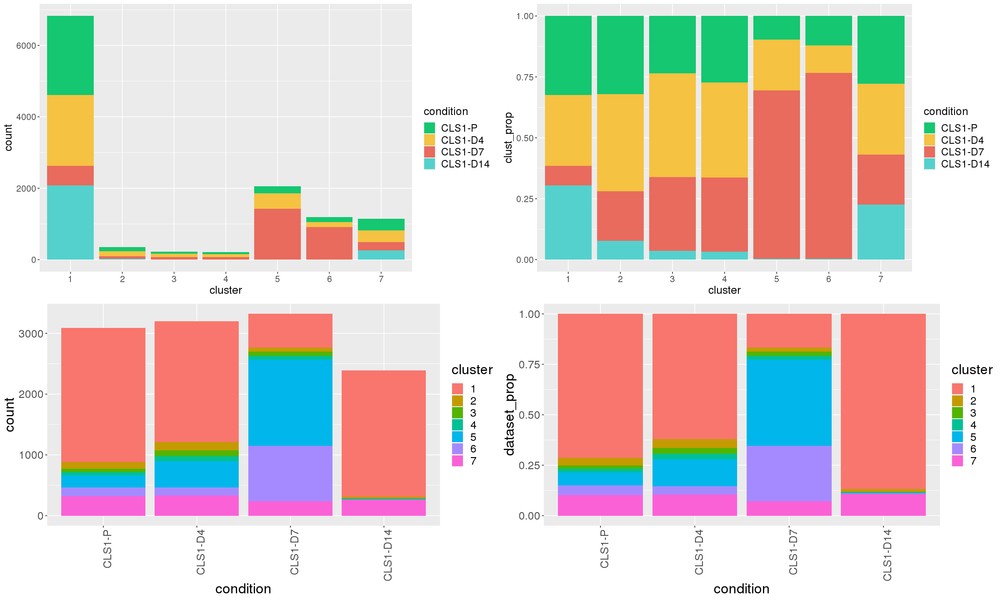

In [74]:
options(repr.plot.width=20, repr.plot.height=12)

gps1<-ggplot(plot.data2, aes(x = cluster, y = count, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gps2<-ggplot(plot.data2, aes(x = cluster, y = clust_prop, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gps3<-ggplot(plot.data2, aes(x = condition, y = count, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

gps4<-ggplot(plot.data2, aes(x = condition, y = dataset_prop, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

plot_grid(gps1, gps2, gps3, gps4, ncol = 2)